In [43]:
%load_ext autoreload
%autoreload 2




import matplotlib.pyplot as plt
import numpy as np
import os,sys



current=os.path.abspath('')
parent = os.path.dirname(current)

sys.path.append(parent)



from ImageProcessing.processing import cropToCoin

plt.rcParams['figure.figsize'] = [10, 5]
plt.rcParams['figure.dpi'] = 120



listeChemin = []

basepath = 'data/'
for entry in os.listdir(basepath):
    if os.path.isfile(os.path.join(basepath, entry)):
        listeChemin.append(basepath + entry)
        
pathList = listeChemin[:]

pathListS = sorted(pathList)
print(len(pathList))


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
300
['data/1112 Droit.jpg', 'data/1255 Droit.jpg', 'data/1259 Droit.jpg', 'data/1271 Droit.jpg', 'data/1274 Droit.jpg']
['data/1112 Droit.jpg', 'data/1255 Droit.jpg', 'data/1259 Droit.jpg', 'data/1271 Droit.jpg', 'data/1274 Droit.jpg']


In [30]:
D = np.load("DistMatrix19.npy")

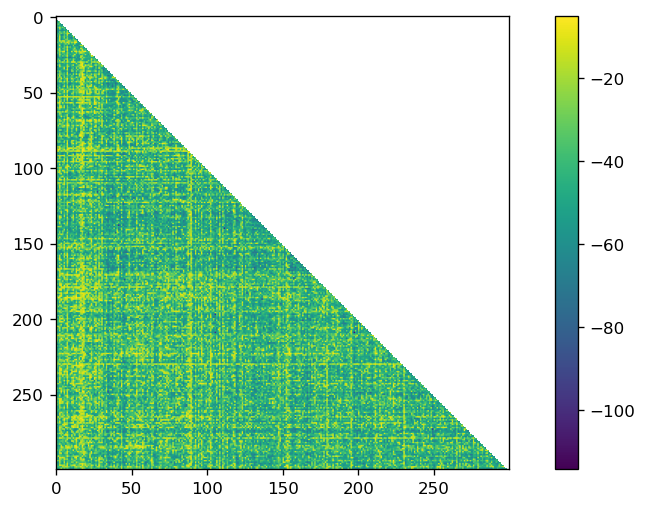

In [31]:
plt.imshow(D)
plt.colorbar()

In [32]:
valD = np.copy(D)
valD = np.ravel(D)
valD = valD[~np.isnan(valD)]

Text(0, 0.5, 'nombre')

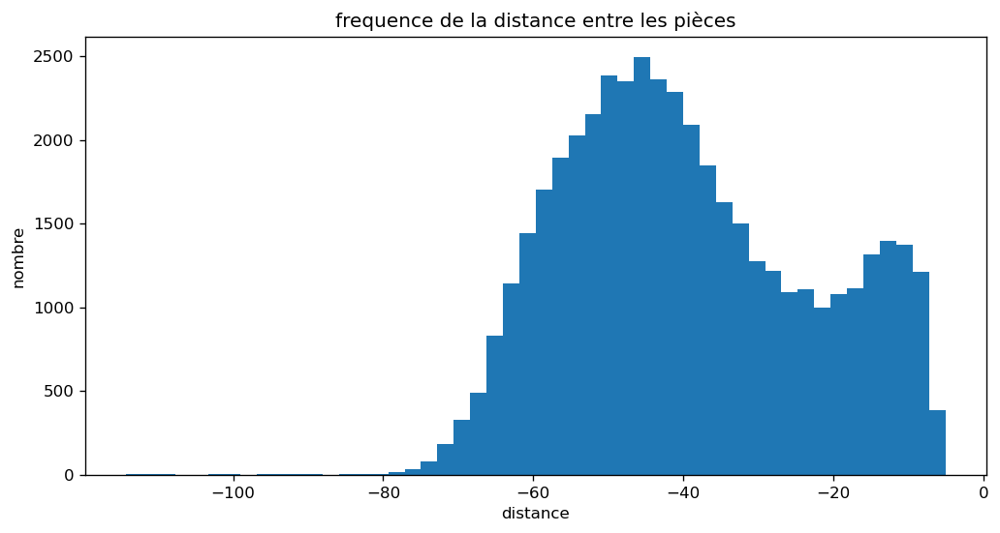

In [33]:
n, bins, patches = plt.hist(valD,bins=50)
plt.title("frequence de la distance entre les pièces")
plt.xlabel("distance")
plt.ylabel("nombre")

Text(0, 0.5, 'nombre')

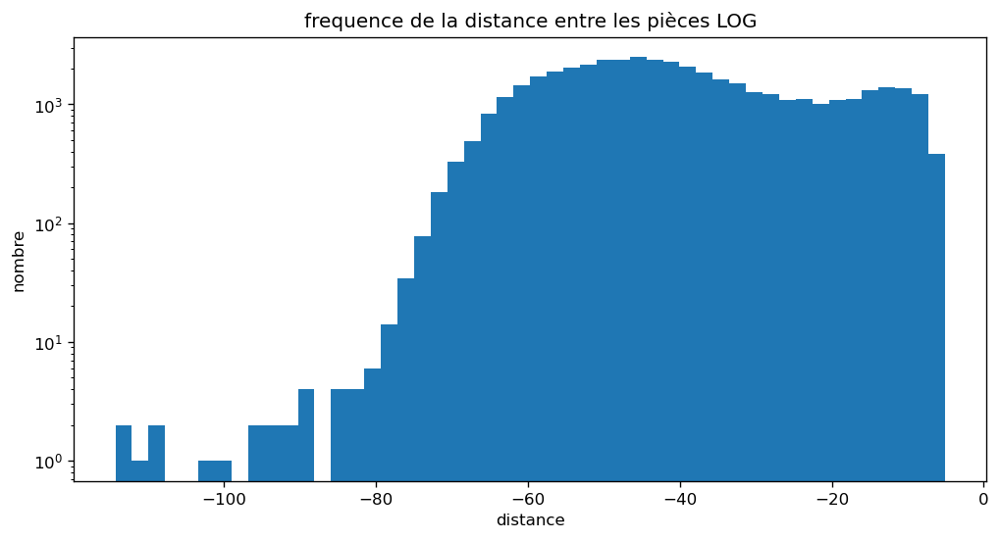

In [34]:

n, bins, patches = plt.hist(valD,bins=50,log=True)
plt.title("frequence de la distance entre les pièces LOG")
plt.xlabel("distance")
plt.ylabel("nombre")

In [35]:
np.sum(valD<-88)

17

In [36]:
Dcopy = np.nan_to_num(D)
shape = np.shape(Dcopy)

In [37]:
bestIndex = np.argsort(Dcopy.ravel())

In [38]:
print(bestIndex)

[62897 82149 41441 ... 29811 29692 89999]


In [39]:
bestIdx = np.unravel_index(bestIndex[:17],shape)

In [40]:
best = np.array(bestIdx).T

In [41]:
best

array([[209, 197],
       [273, 249],
       [138,  41],
       [197, 105],
       [140, 111],
       [209, 105],
       [116,  27],
       [173, 157],
       [174,  45],
       [180,  68],
       [187, 136],
       [248,  34],
       [183, 126],
       [143,  39],
       [168, 154],
       [265, 158],
       [201, 163]], dtype=int64)

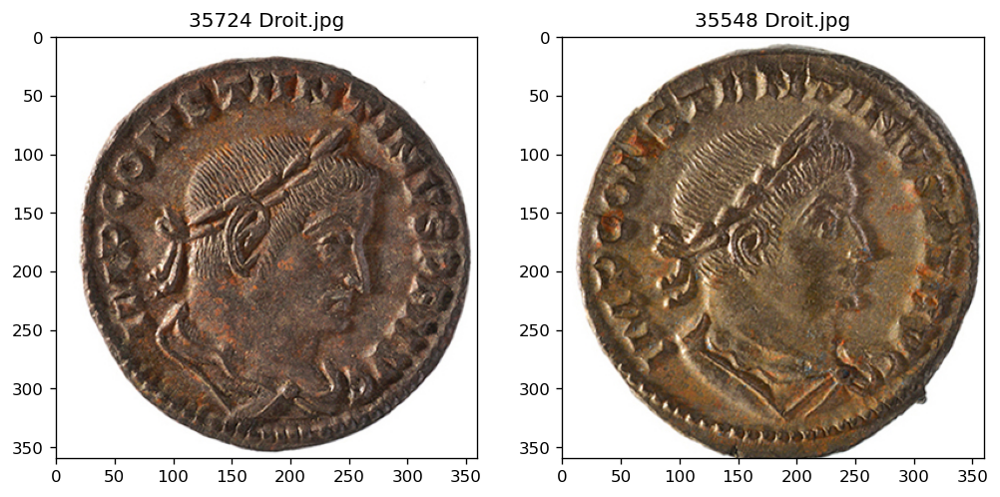

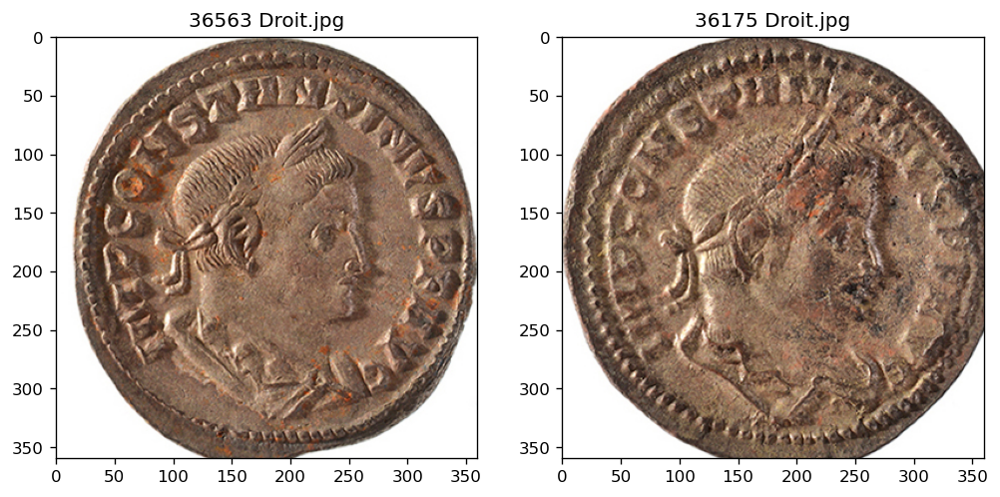

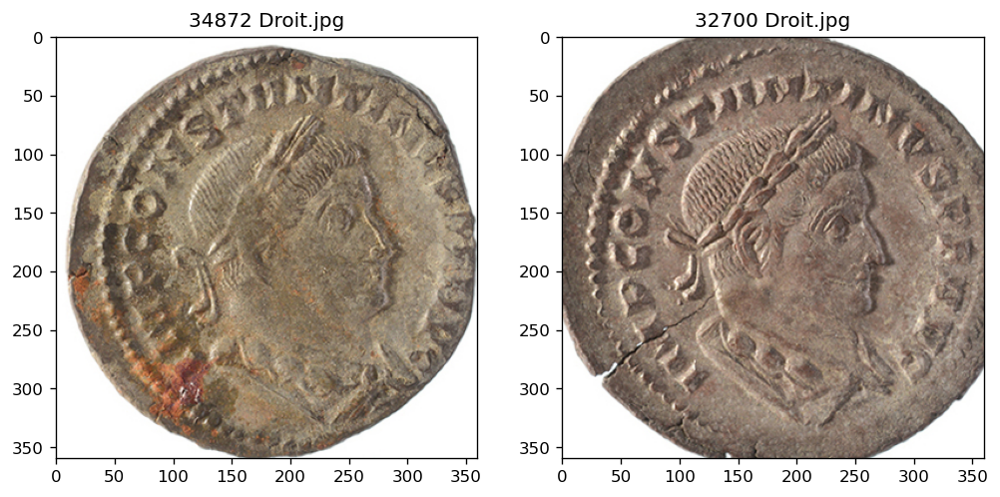

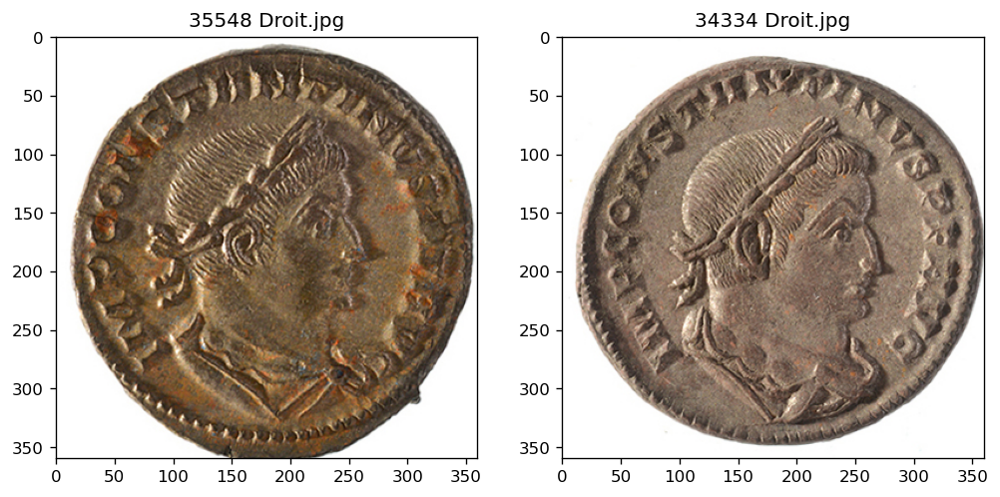

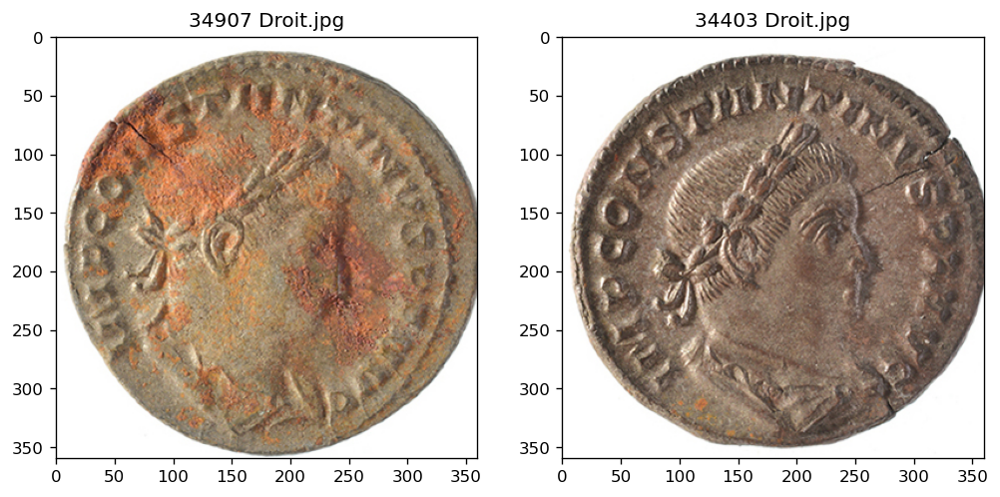

...

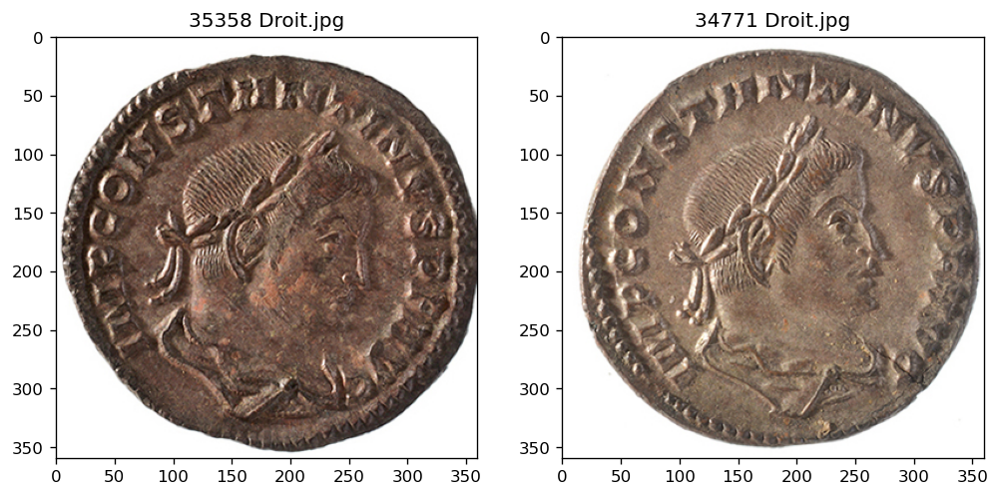

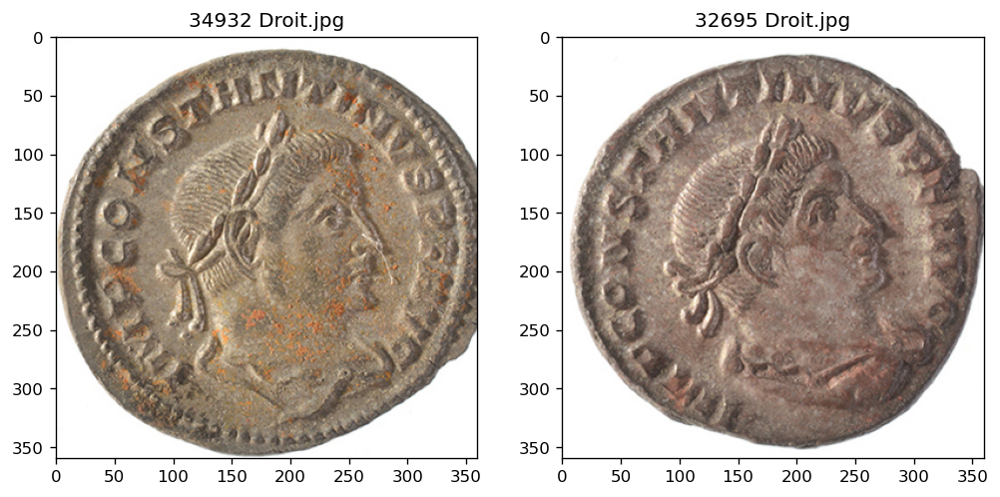

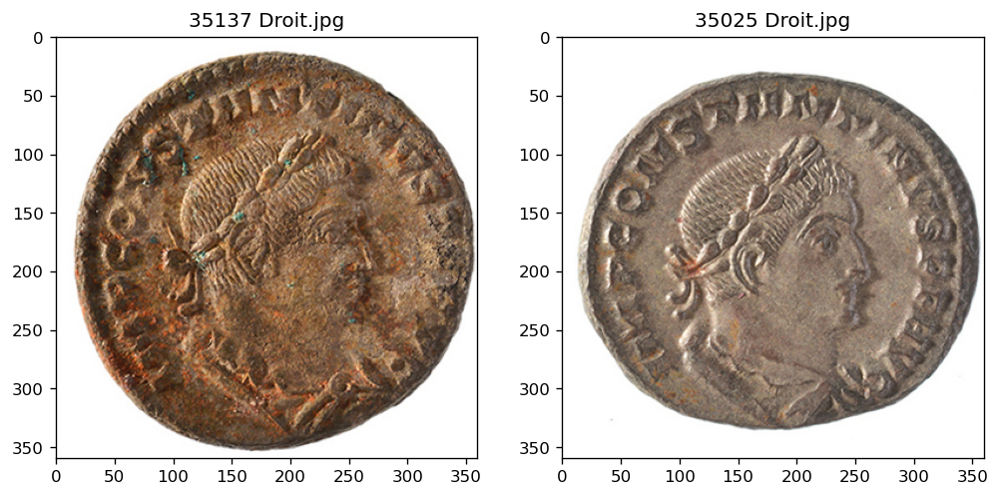

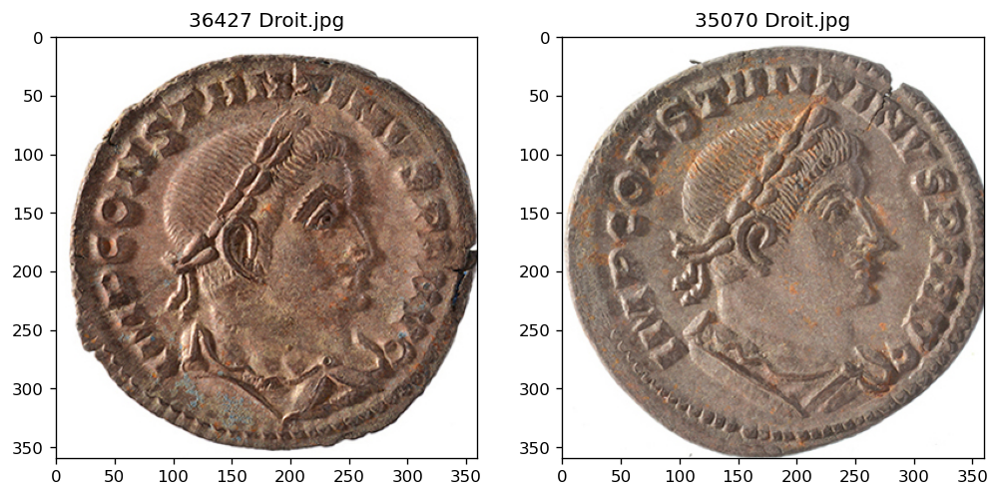

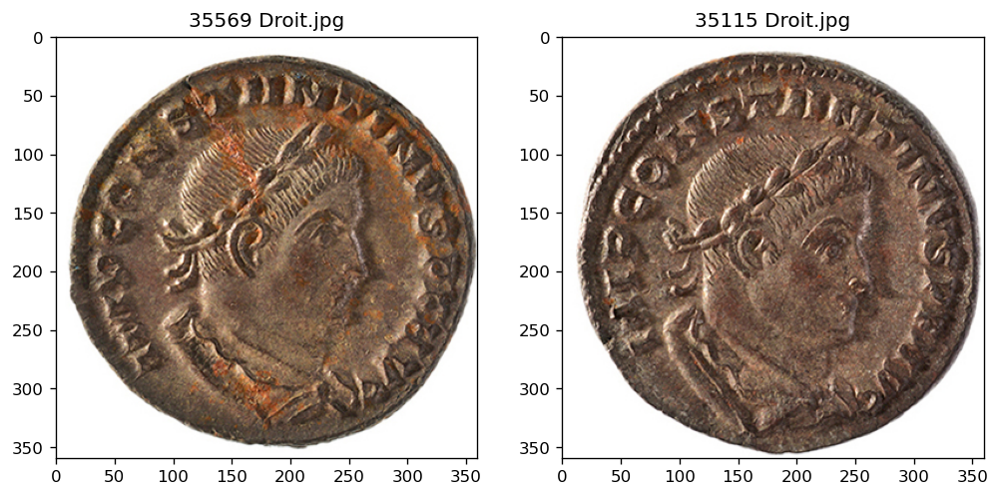

In [42]:
#Savegarde des nbSauvegarde

nbSauvegarde = 17
for i in range(nbSauvegarde):
    plt.figure()
    
    path1 = pathList[best[i,0]]
    path2 = pathList[best[i,1]]

    img1 = cropToCoin(path1)
    img2 = cropToCoin(path2)

    plt.subplot(1,2,1)
    plt.imshow(img1)
    plt.title(path1[5:])

    plt.subplot(1,2,2)
    plt.imshow(img2)
    plt.title(path2[5:])
    
    #plt.savefig("best/%d.png"%(i+1))
    